<a href="https://colab.research.google.com/github/silvi-no26/c_vision/blob/main/Exercise1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


<ipython-input-2-c937f23c70e9>:9: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.imshow(IC)
<ipython-input-2-c937f23c70e9>:10: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.show()


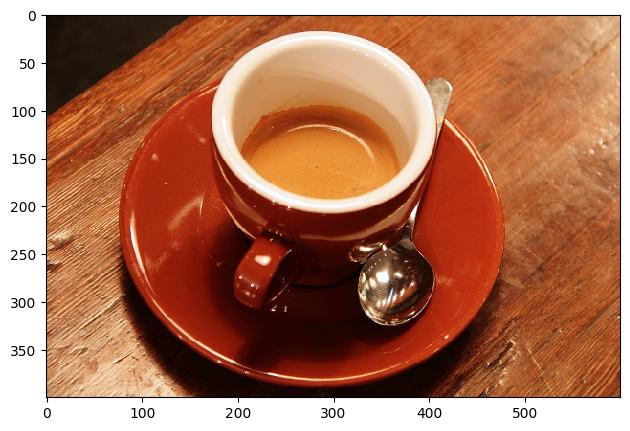

M = 400 columns, N = 600 rows, NC = 3 color channels


In [ ]:
import skimage as sk
import matplotlib.pyplot as plt
import numpy as np
from skimage.util import random_noise
from skimage.util import img_as_ubyte
#TASK 1
# Load coffee image
IC = sk.data.coffee()
sk.io.imshow(IC)
sk.io.show()
print('M = {} columns, N = {} rows, NC = {} color channels'.format(*IC.shape))

<ipython-input-3-cf102f489be4>:3: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.imshow(IG)
<ipython-input-3-cf102f489be4>:4: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.show()


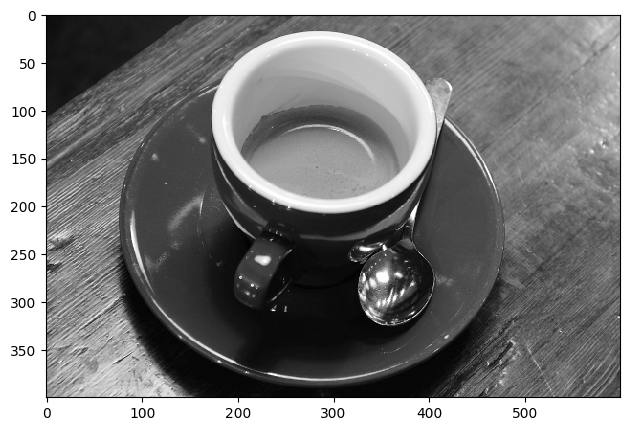

np.uint8(255)

In [ ]:
# Convert to gray scale
IG = sk.color.rgb2gray(IC)
sk.io.imshow(IG)
sk.io.show()

# Convert grayscale image to uint8
IGB = img_as_ubyte(IG)
np.max(IGB)

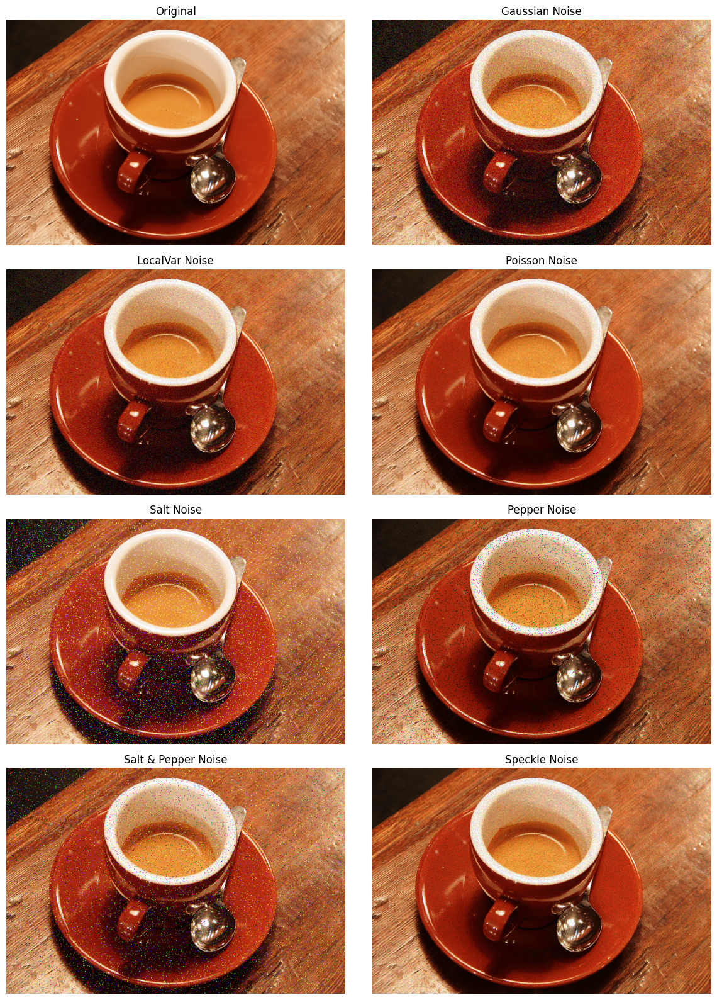

In [ ]:
#TASK 2
# 1. Gaussian noise
IC_gaussian = random_noise(IC, mode='gaussian', mean=0, var=0.01)
IC_gaussian = img_as_ubyte(IC_gaussian)

# 2. Local Variance noise
local_vars = np.random.uniform(0, 0.01, size=IC.shape)
IC_localvar = random_noise(IC, mode='localvar', local_vars=local_vars)
IC_localvar = img_as_ubyte(IC_localvar)

# 3. Poisson noise
IC_poisson = random_noise(IC, mode='poisson')
IC_poisson = img_as_ubyte(IC_poisson)

# 4. Salt noise
IC_salt = random_noise(IC, mode='salt', amount=0.05)
IC_salt = img_as_ubyte(IC_salt)

# 5. Pepper noise
IC_pepper = random_noise(IC, mode='pepper', amount=0.05)
IC_pepper = img_as_ubyte(IC_pepper)

# 6. Salt & Pepper noise
IC_s_and_p = random_noise(IC, mode='s&p', amount=0.05, salt_vs_pepper=0.5)
IC_s_and_p = img_as_ubyte(IC_s_and_p)

# 7. Speckle noise
IC_speckle = random_noise(IC, mode='speckle', mean=0, var=0.01)
IC_speckle = img_as_ubyte(IC_speckle)

fig, axs = plt.subplots(4, 2, figsize=(12, 16))

# Original image
axs[0, 0].imshow(IC)
axs[0, 0].set_title("Original")
axs[0, 0].axis('off')

# Gaussian noise
axs[0, 1].imshow(IC_gaussian)
axs[0, 1].set_title("Gaussian Noise")
axs[0, 1].axis('off')

# Local Variance noise
axs[1, 0].imshow(IC_localvar)
axs[1, 0].set_title("LocalVar Noise")
axs[1, 0].axis('off')

# Poisson noise
axs[1, 1].imshow(IC_poisson)
axs[1, 1].set_title("Poisson Noise")
axs[1, 1].axis('off')

# Salt noise
axs[2, 0].imshow(IC_salt)
axs[2, 0].set_title("Salt Noise")
axs[2, 0].axis('off')

# Pepper noise
axs[2, 1].imshow(IC_pepper)
axs[2, 1].set_title("Pepper Noise")
axs[2, 1].axis('off')

# Salt & Pepper noise
axs[3, 0].imshow(IC_s_and_p)
axs[3, 0].set_title("Salt & Pepper Noise")
axs[3, 0].axis('off')

# Speckle noise
axs[3, 1].imshow(IC_speckle)
axs[3, 1].set_title("Speckle Noise")
axs[3, 1].axis('off')

plt.tight_layout()
plt.show()

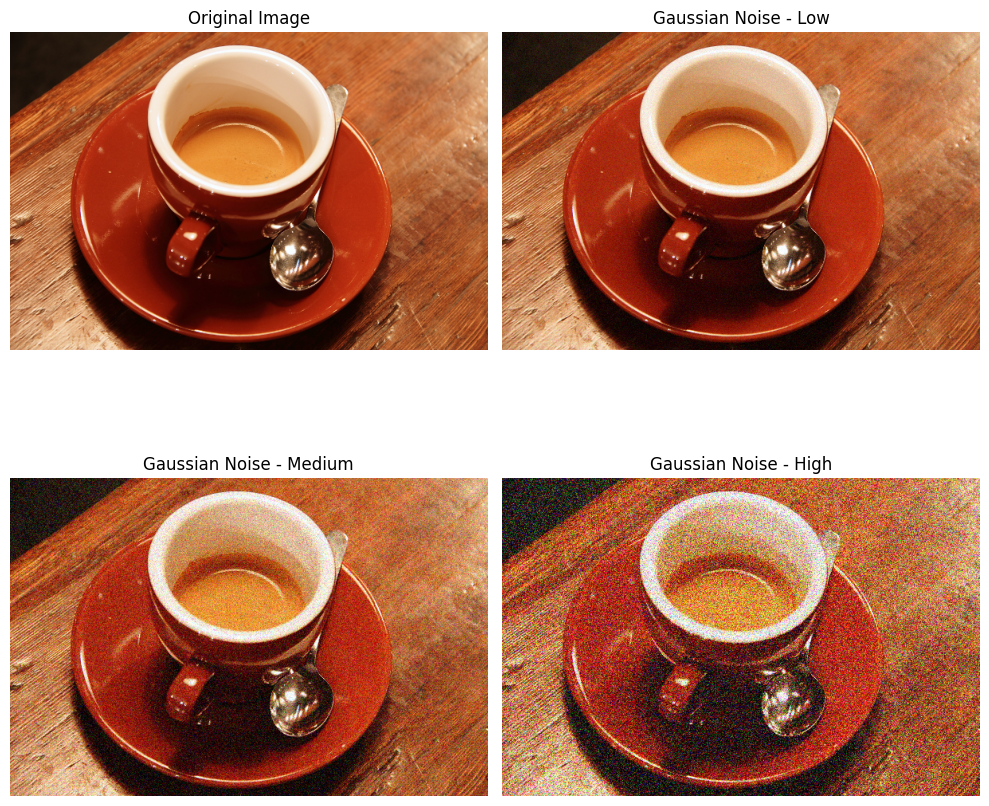

In [ ]:
#TASK 3
# Generate Gaussian noise with varying intensity (variance)
IC_gaussian_low = random_noise(IC, mode='gaussian', var=0.001)
IC_gaussian_low = img_as_ubyte(IC_gaussian_low)

IC_gaussian_medium = random_noise(IC, mode='gaussian', var=0.01)
IC_gaussian_medium = img_as_ubyte(IC_gaussian_medium)

IC_gaussian_high = random_noise(IC, mode='gaussian', var=0.05)
IC_gaussian_high = img_as_ubyte(IC_gaussian_high)

# Plotting in a 2x2 grid
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

axs[0, 0].imshow(IC)
axs[0, 0].set_title("Original Image")
axs[0, 0].axis('off')

axs[0, 1].imshow(IC_gaussian_low)
axs[0, 1].set_title("Gaussian Noise - Low")
axs[0, 1].axis('off')

axs[1, 0].imshow(IC_gaussian_medium)
axs[1, 0].set_title("Gaussian Noise - Medium")
axs[1, 0].axis('off')

axs[1, 1].imshow(IC_gaussian_high)
axs[1, 1].set_title("Gaussian Noise - High")
axs[1, 1].axis('off')

plt.tight_layout()
plt.show()

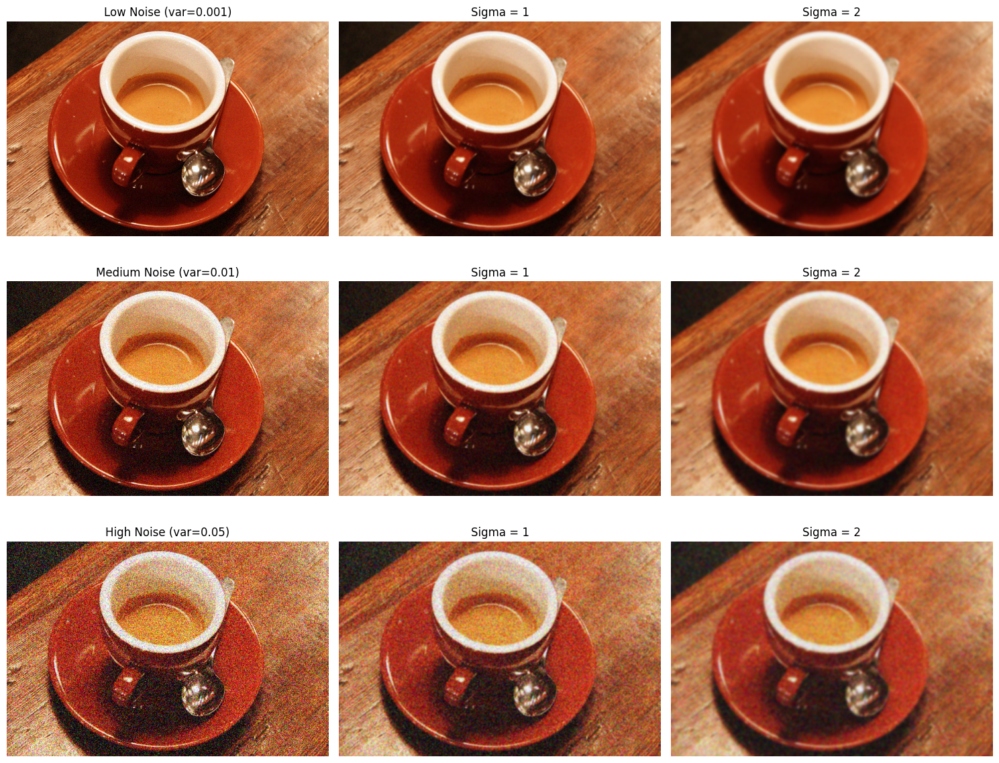

In [ ]:
#TASK 4
from skimage.filters import gaussian

# For IC_gaussian_low
filtered_low_sigma1 = gaussian(IC_gaussian_low, sigma=1, channel_axis=-1)
filtered_low_sigma2 = gaussian(IC_gaussian_low, sigma=2, channel_axis=-1)

# For IC_gaussian_medium
filtered_medium_sigma1 = gaussian(IC_gaussian_medium, sigma=1, channel_axis=-1)
filtered_medium_sigma2 = gaussian(IC_gaussian_medium, sigma=2, channel_axis=-1)

# For IC_gaussian_high
filtered_high_sigma1 = gaussian(IC_gaussian_high, sigma=1, channel_axis=-1)
filtered_high_sigma2 = gaussian(IC_gaussian_high, sigma=2, channel_axis=-1)

# Plotting the results
fig, axs = plt.subplots(3, 3, figsize=(15, 12))

#Low noise
axs[0, 0].imshow(IC_gaussian_low)
axs[0, 0].set_title("Low Noise (var=0.001)")
axs[0, 0].axis('off')

axs[0, 1].imshow(filtered_low_sigma1)
axs[0, 1].set_title("Sigma = 1")
axs[0, 1].axis('off')

axs[0, 2].imshow(filtered_low_sigma2)
axs[0, 2].set_title("Sigma = 2")
axs[0, 2].axis('off')

#Medium noise
axs[1, 0].imshow(IC_gaussian_medium)
axs[1, 0].set_title("Medium Noise (var=0.01)")
axs[1, 0].axis('off')

axs[1, 1].imshow(filtered_medium_sigma1)
axs[1, 1].set_title("Sigma = 1")
axs[1, 1].axis('off')

axs[1, 2].imshow(filtered_medium_sigma2)
axs[1, 2].set_title("Sigma = 2")
axs[1, 2].axis('off')

#High noise
axs[2, 0].imshow(IC_gaussian_high)
axs[2, 0].set_title("High Noise (var=0.05)")
axs[2, 0].axis('off')

axs[2, 1].imshow(filtered_high_sigma1)
axs[2, 1].set_title("Sigma = 1")
axs[2, 1].axis('off')

axs[2, 2].imshow(filtered_high_sigma2)
axs[2, 2].set_title("Sigma = 2")
axs[2, 2].axis('off')

plt.tight_layout()
plt.show()

--Commenting the results of task 4--

Gaussian filtering smooths the image by reducing noise but also slightly blurring details. As sigma increases, the filter becomes wider and more smoothing occurs:

-For low noise, sigma=1 already nearly removes all noise.

-For medium noise, sigma=1 reduces noise slightly; sigma=2 does better but starts blurring edges.

-For high noise, sigma=1 is insufficient, and sigma=2 reduces noise better but with visible loss of detail.

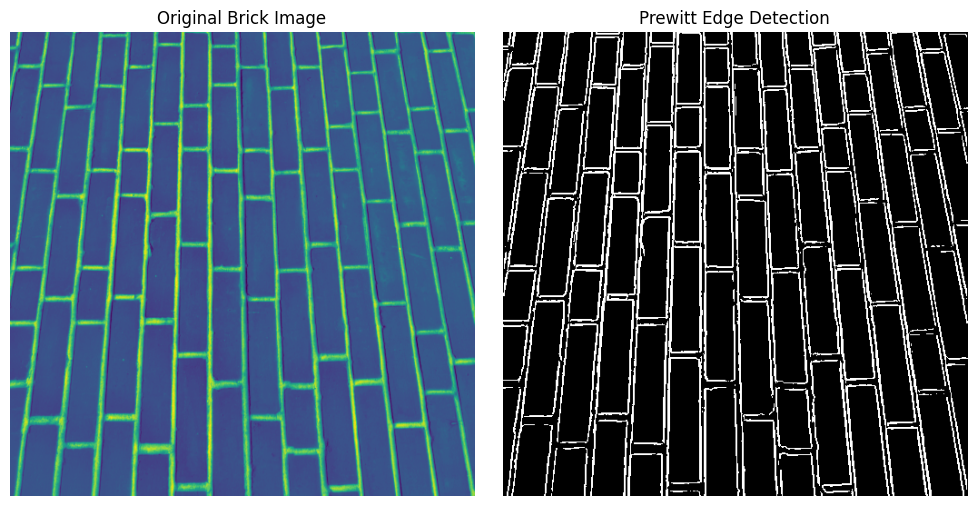

Fraction of image corresponding to edges: 0.1504
Fraction of image corresponding to bricks (non-edges): 0.8496


In [8]:
#TASK 5
import skimage as sk
from skimage.filters import prewitt
import matplotlib.pyplot as plt
import numpy as np

# Load the image
bricks = sk.data.brick()

bricks_gray = bricks

# Prewitt edge detection
edges = prewitt(bricks_gray)

# Threshold to binary edge mask
edge_mask = edges > 0.1

# Compute fractions
total_pixels = bricks_gray.size
edge_pixels = np.sum(edge_mask)
brick_pixels = total_pixels - edge_pixels

edge_fraction = edge_pixels / total_pixels
brick_fraction = brick_pixels / total_pixels

# Show the original and edge-detected images
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(bricks)
axs[0].set_title("Original Brick Image")
axs[0].axis('off')

axs[1].imshow(edge_mask, cmap='gray')
axs[1].set_title("Prewitt Edge Detection")
axs[1].axis('off')

plt.tight_layout()
plt.show()

# Print the fractions
print(f"Fraction of image corresponding to edges: {edge_fraction:.4f}")
print(f"Fraction of image corresponding to bricks (non-edges): {brick_fraction:.4f}")

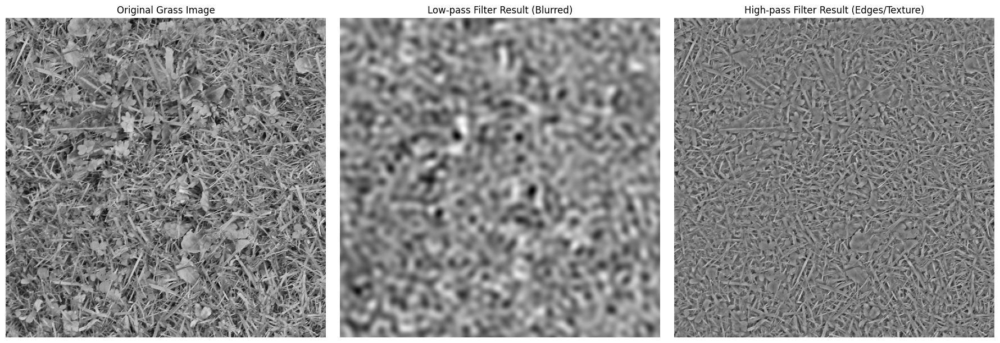

In [9]:
#TASK 6
import numpy as np
import matplotlib.pyplot as plt
import skimage as sk
from skimage.color import rgb2gray
from skimage.util import img_as_float
from numpy.fft import fft2, fftshift, ifft2, ifftshift

# Load grass image and convert to grayscale + float
grass_rgb = sk.data.grass()
grass_gray = img_as_float(grass_rgb)

# Fourier Transform
F = fft2(grass_gray)
F_shifted = fftshift(F)
m, n = grass_gray.shape
crow, ccol = m // 2 , n // 2

# Create a low-pass filter (pass center frequencies)
low_pass = np.zeros_like(grass_gray)
r = 30  # radius of the low-pass circle
Y, X = np.ogrid[:m, :n]
mask_area = (X - ccol)**2 + (Y - crow)**2 <= r*r
low_pass[mask_area] = 1

# Create a high-pass filter (block center, pass edges)
high_pass = 1 - low_pass

# Apply filters
F_low = F_shifted * low_pass
F_high = F_shifted * high_pass

# Inverse Fourier Transform
img_low = np.real(ifft2(ifftshift(F_low)))
img_high = np.real(ifft2(ifftshift(F_high)))

# Display
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

axs[0].imshow(grass_gray, cmap='gray')
axs[0].set_title('Original Grass Image')
axs[0].axis('off')

axs[1].imshow(img_low, cmap='gray')
axs[1].set_title('Low-pass Filter Result (Blurred)')
axs[1].axis('off')

axs[2].imshow(img_high, cmap='gray')
axs[2].set_title('High-pass Filter Result (Edges/Texture)')
axs[2].axis('off')

plt.tight_layout()
plt.show()

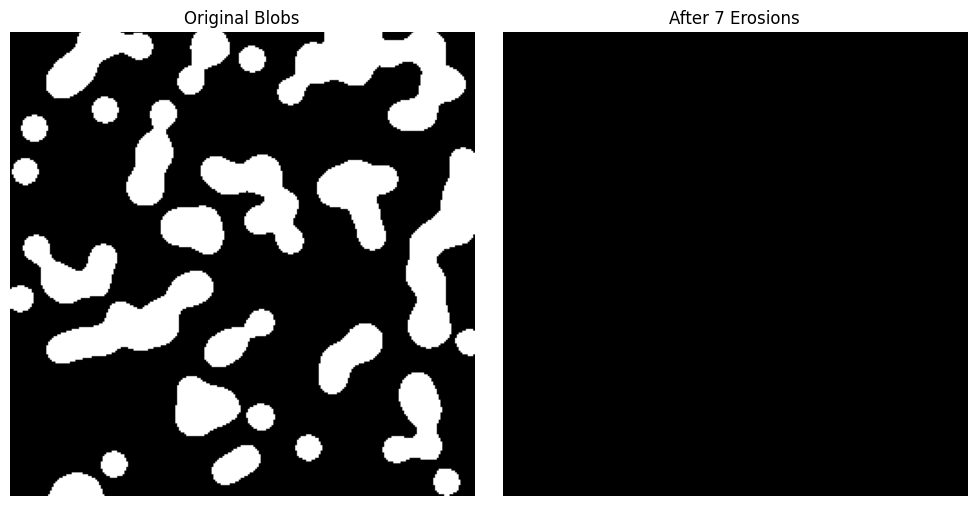

Total erosions needed to remove all blobs: 7


In [12]:
#TASK7
import matplotlib.pyplot as plt
from skimage.data import binary_blobs
from skimage.morphology import erosion, disk
import numpy as np

# Set random seed manually (before calling binary_blobs)
np.random.seed(1)

# Generate a binary image with random blobs
blobs = binary_blobs(length=256, volume_fraction=0.3)

# Structuring element: disk of radius 3
selem = disk(3)

# Track number of erosions
count = 0
eroded = blobs.copy()

# Apply erosion until no white pixels remain
while np.any(eroded):
    eroded = erosion(eroded, footprint=selem)
    count += 1

# Display original and eroded image
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(blobs, cmap='gray')
axs[0].set_title("Original Blobs")
axs[0].axis('off')

axs[1].imshow(eroded, cmap='gray')
axs[1].set_title(f"After {count} Erosions")
axs[1].axis('off')

plt.tight_layout()
plt.show()

print(f"Total erosions needed to remove all blobs: {count}")